# Eye side prediction using YOLO

In [3]:
from ultralytics import YOLO
import os
import cv2
import numpy as np
from tqdm import tqdm
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
from IPython.display import display
from sklearn.metrics import confusion_matrix, classification_report


In [3]:
def show_classification_results(model, image_dir, image_numbers, conf=0.25, cols=5, figsize=(20, 10)):
    """
    Predicts 'left' or 'right' classification for multiple images and displays
    them with colored borders according to the predicted label.

    Args:
        model: Classification model with a .predict() or .predictor() method
        image_dir: directory containing input images
        image_numbers: list of image numbers (e.g., [1, 2, 3])
        conf: optional confidence threshold (used if model returns confidences)
        cols: number of columns in the subplot grid
        figsize: overall figure size
    """
    image_dir = Path(image_dir)
    rows = int(np.ceil(len(image_numbers) / cols))
    plt.figure(figsize=figsize)

    for i, num in enumerate(image_numbers):
        filename = f"{num:04d}.png"
        img_path = image_dir / filename

        # Load and preprocess image
        img = cv2.imread(str(img_path))
        if img is None:
            print(f"[Warning] Could not read {filename}")
            continue
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Get model prediction
        results = model.predict(source=str(img_path), conf=conf, verbose=False, show=False, save=False)

        # Extract label and (optionally) confidence
        if hasattr(results[0], "probs"):
            probs = results[0].probs.data.cpu().numpy()
            label_idx = np.argmax(probs)
            label = results[0].names[label_idx]
            confidence = probs[label_idx]
        else:
            label = results[0].names[int(results[0].probs.top1)]
            confidence = results[0].probs.top1conf.item()

        # Choose color based on label
        if label.lower() == "left":
            color = (255, 0, 0)  # Red
        elif label.lower() == "right":
            color = (0, 255, 0)  # Green
        else:
            color = (255, 255, 0)  # Yellow for unknown

        # Draw border
        border_thickness = 10
        img_with_border = cv2.copyMakeBorder(
            img_rgb,
            border_thickness,
            border_thickness,
            border_thickness,
            border_thickness,
            cv2.BORDER_CONSTANT,
            value=color,
        )

        # Add text label
        label_text = f"{label.upper()} ({confidence:.2f})"
        cv2.putText(
            img_with_border,
            label_text,
            (20, 40),
            cv2.FONT_HERSHEY_SIMPLEX,
            1.2,
            (255, 255, 255),
            3,
            cv2.LINE_AA,
        )

        # Plot
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img_with_border)
        plt.title(filename)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

In [11]:
from ultralytics import YOLO

model = YOLO('runs/train/eye_side_classification8/weights/eye_side.pt')

# Run prediction with visualize=True
results = model.predict("data/eye/train/0002.png", visualize=True)
results = model.predict("data/eye/train/0003.png", visualize=True)
results = model.predict("data/eye/train/0006.png", visualize=True)


Saving C:\Users\Domodekavkaz\Documents\Stage\papillae_detection\runs\classify\predict2\0002\stage0_Conv_features.png... (32/96)
Saving C:\Users\Domodekavkaz\Documents\Stage\papillae_detection\runs\classify\predict2\0002\stage1_Conv_features.png... (32/192)
Saving C:\Users\Domodekavkaz\Documents\Stage\papillae_detection\runs\classify\predict2\0002\stage2_C3k2_features.png... (32/384)
Saving C:\Users\Domodekavkaz\Documents\Stage\papillae_detection\runs\classify\predict2\0002\stage3_Conv_features.png... (32/384)
Saving C:\Users\Domodekavkaz\Documents\Stage\papillae_detection\runs\classify\predict2\0002\stage4_C3k2_features.png... (32/768)
Saving C:\Users\Domodekavkaz\Documents\Stage\papillae_detection\runs\classify\predict2\0002\stage5_Conv_features.png... (32/768)
Saving C:\Users\Domodekavkaz\Documents\Stage\papillae_detection\runs\classify\predict2\0002\stage6_C3k2_features.png... (32/768)
Saving C:\Users\Domodekavkaz\Documents\Stage\papillae_detection\runs\classify\predict2\0002\stage

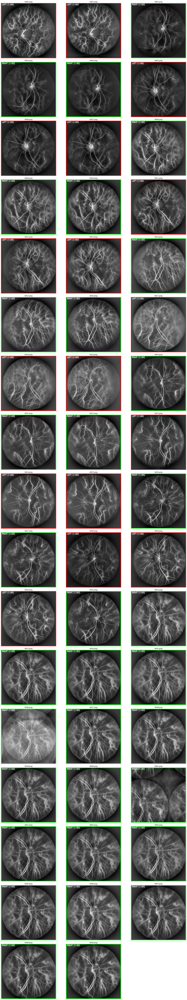

In [9]:
trained_model = YOLO("runs/train/eye_side_classification8/weights/eye_side.pt")
show_classification_results(trained_model, "data/eye/train", range(400, 450), cols=3, figsize=(20, 100))

In [4]:
model = YOLO("runs/train/eye_side_classification8/weights/eye_side.pt")

# Run validation
metrics = model.val()

# Extract key numbers for the paper
top1_acc = metrics.top1
top5_acc = metrics.top5
print(f"Top-1 Accuracy: {top1_acc:.4f}")
print(f"Top-5 Accuracy: {top5_acc:.4f}")

# Get Confusion Matrix details
cm = metrics.confusion_matrix.matrix
print("\nConfusion Matrix:")
print(cm)
print(f"True Left (Left classified as Left): {cm[0,0]}")
print(f"False Right (Left classified as Right): {cm[0,1]}")
print(f"False Left (Right classified as Left): {cm[1,0]}")
print(f"True Right (Right classified as Right): {cm[1,1]}")

# Speed Benchmarking
# Run a prediction on a dummy image to see speed
results = model.predict(source=np.zeros((640, 640, 3), dtype=np.uint8), verbose=False)
speed = results[0].speed
print(f"\nInference Speed:")
print(f"Preprocess: {speed['preprocess']:.2f}ms")
print(f"Inference: {speed['inference']:.2f}ms")
print(f"Postprocess: {speed['postprocess']:.2f}ms")
print(f"Total per image: {sum(speed.values()):.2f}ms")

Ultralytics 8.3.234  Python-3.12.10 torch-2.8.0+cu126 CUDA:0 (NVIDIA RTX A6000, 49140MiB)
YOLO11x-cls summary (fused): 94 layers, 28,334,978 parameters, 0 gradients, 110.3 GFLOPs
train: C:\Users\Domodekavkaz\Documents\Stage\papillae_detection\datasets\classification\train... found 1214 images in 2 classes  
val: C:\Users\Domodekavkaz\Documents\Stage\papillae_detection\datasets\classification\valid... found 204 images in 2 classes  
test: C:\Users\Domodekavkaz\Documents\Stage\papillae_detection\datasets\classification\test... found 202 images in 2 classes  
val: Fast image access  (ping: 0.00.0 ms, read: 1058.1327.7 MB/s, size: 66.1 KB)
val: Scanning C:\Users\Domodekavkaz\Documents\Stage\papillae_detection\datasets\classification\valid... 204 images, 0 corrupt: 100% ━━━━━━━━━━━━ 204/204  0.0s
               classes   top1_acc   top5_acc: 100% ━━━━━━━━━━━━ 13/13 4.0it/s 3.3s0.1s
                   all     0.0196          1
Speed: 0.9ms preprocess, 7.4ms inference, 0.0ms loss, 0.0ms postp

In [15]:
res = model.predict("datasets/classification/test/left/0021.png", visualize=False)
probs = res[0].probs.data.cpu().numpy()
for i in range(2):
    print(res[0].names[i], probs[i])

right 1.13900195e-10
left 1.0


In [16]:
res = model.predict("datasets/classification/test/right/0046.png", visualize=False)
probs = res[0].probs.data.cpu().numpy()
for i in range(2):
    print(res[0].names[i], probs[i])

right 1.0
left 1.5714022e-09


In [5]:
def get_combined_confusion_matrix(model_path, data_dir):
    """
    Generates a confusion matrix combining both 'valid' and 'test' sets.
    Assumes structure: data_dir/valid/left/*.png, data_dir/test/right/*.png
    """
    # Load Model
    model = YOLO(model_path)

    # Define the exact class mapping we want to enforce
    class_names = ['right', 'left']
    class_map = {name: i for i, name in enumerate(class_names)}

    print(f"Enforced class mapping for Ground Truth: {class_map}")

    # Collect all valid image paths first
    image_list = []

    # Check specifically for 'valid' and 'test' folders
    subsets = ['test']

    for subset in subsets:
        subset_path = os.path.join(data_dir, subset)
        if not os.path.exists(subset_path):
            print(f"Warning: Directory not found: {subset_path}")
            continue

        for class_name in class_names:
            class_folder = os.path.join(subset_path, class_name)
            if not os.path.exists(class_folder):
                continue

            # Scan for PNG files
            files = [
                os.path.join(class_folder, f)
                for f in os.listdir(class_folder)
                if f.lower().endswith('.png')
            ]

            # Add to list as (path, true_label_index)
            for f in files:
                image_list.append((f, class_map[class_name]))

    print(f"Found {len(image_list)} images total in 'valid' + 'test'. Starting inference...")

    # Run Inference with Progress Bar
    y_true = []
    y_pred = []
    failed_cases = []  # List to store failures

    # Iterate using standard tqdm
    for img_path, true_label in tqdm(image_list, desc="Classifying Images"):
        # Run prediction
        result = model.predict(img_path, verbose=False)[0]

        # Get the predicted class index (0 or 1)
        pred_label = result.probs.top1

        y_true.append(true_label)
        y_pred.append(pred_label)

        # Check for failure
        if pred_label != true_label:
            failed_cases.append({
                "path": img_path,
                "true": class_names[true_label],
                "pred": class_names[pred_label]
            })

    # Compute Metrics
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    cm = confusion_matrix(y_true, y_pred)
    acc = np.trace(cm) / np.sum(cm) if np.sum(cm) > 0 else 0

    # Display Results
    print(f"\n--- Combined Results ({' + '.join(subsets)}) ---")
    print(f"Total Images: {len(y_true)}")
    print(f"Accuracy: {acc*100:.2f}%")
    print("\nConfusion Matrix (Raw):")
    print(cm)

    print("\nClassification Report:")
    print(classification_report(y_true, y_pred, target_names=class_names, digits=4))

    # Print Failed Images
    if failed_cases:
        print(f"\n--- Misclassified Images ({len(failed_cases)}) ---")
        for case in failed_cases:
            print(f"File: {case['path']}")
            print(f"  Expected: {case['true']} | Predicted: {case['pred']}")
            print("-" * 30)
    else:
        print("\nGreat job! No misclassified images found.")

    return cm, class_names

model_path = "eye_side.pt"
dataset_path = "classification/"
cm, names = get_combined_confusion_matrix(model_path, dataset_path)

Enforced class mapping for Ground Truth: {'right': 0, 'left': 1}
Found 202 images total in 'valid' + 'test'. Starting inference...


Classifying Images: 100%|██████████| 202/202 [00:16<00:00, 12.10it/s]


--- Combined Results (test) ---
Total Images: 202
Accuracy: 98.51%

Confusion Matrix (Raw):
[[113   3]
 [  0  86]]

Classification Report:
              precision    recall  f1-score   support

       right     1.0000    0.9741    0.9869       116
        left     0.9663    1.0000    0.9829        86

    accuracy                         0.9851       202
   macro avg     0.9831    0.9871    0.9849       202
weighted avg     0.9856    0.9851    0.9852       202


--- Misclassified Images (3) ---
File: classification/test\right\1094.png
  Expected: right | Predicted: left
------------------------------
File: classification/test\right\1095.png
  Expected: right | Predicted: left
------------------------------
File: classification/test\right\1096.png
  Expected: right | Predicted: left
------------------------------


In [7]:
def get_low_confidence_correct_predictions(model_path, data_dir, threshold=0.90):
    """
    Finds images where the model predicted the CORRECT class
    but with a confidence score lower than the threshold.
    """
    # Load Model
    model = YOLO(model_path)
    class_names = ['right', 'left']
    class_map = {name: i for i, name in enumerate(class_names)}

    # Collect image paths
    image_list = []
    subsets = ['test']

    for subset in subsets:
        for class_name in class_names:
            class_folder = os.path.join(data_dir, subset, class_name)
            if not os.path.exists(class_folder):
                continue

            files = [os.path.join(class_folder, f) for f in os.listdir(class_folder) if f.lower().endswith('.png')]
            for f in files:
                image_list.append((f, class_map[class_name]))

    print(f"Scanning {len(image_list)} images for low-confidence correct predictions...\n")

    results = []

    # Run Inference
    for img_path, true_label in tqdm(image_list, desc="Processing"):
        prediction = model.predict(img_path, verbose=False)[0]

        pred_label = prediction.probs.top1
        conf = float(prediction.probs.top1conf)

        # Condition: Predicted correctly AND confidence is below threshold
        if pred_label == true_label and conf < threshold:
            results.append({
                "path": img_path,
                "probability": conf,
                "class": class_names[pred_label]
            })

    # Output results
    print(f"\n--- Correct Predictions with Confidence < {threshold} ({len(results)} found) ---")
    if results:
        # Sort by probability (lowest first)
        results = sorted(results, key=lambda x: x['probability'])

        for item in results:
            print(f"Prob: {item['probability']:.4f} | Class: {item['class']} | Path: {item['path']}")
    else:
        print("No cases found matching these criteria.")

    return results

model_path = "eye_side.pt"
dataset_path = "classification/"
low_conf_list = get_low_confidence_correct_predictions(model_path, dataset_path)

Scanning 202 images for low-confidence correct predictions...



Processing: 100%|██████████| 202/202 [00:17<00:00, 11.77it/s]


--- Correct Predictions with Confidence < 0.9 (4 found) ---
Prob: 0.5838 | Class: left | Path: classification/test\left\0071.png
Prob: 0.6416 | Class: right | Path: classification/test\right\1050.png
Prob: 0.8103 | Class: left | Path: classification/test\left\1591.png
Prob: 0.8937 | Class: left | Path: classification/test\left\1078.png


In [9]:
def show_class_result(model, img_path, conf=0.25):
    # Load and preprocess image
    img = cv2.imread(str(img_path))
    if img is None:
        print(f"[Warning] Could not read {img_path}")
        return
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Get model prediction
    results = model.predict(source=str(img_path), conf=conf, verbose=False, show=False, save=False)

    # Extract label and confidence
    if hasattr(results[0], "probs") and results[0].probs is not None:
        probs = results[0].probs.data.cpu().numpy()
        label_idx = np.argmax(probs)
        label = results[0].names[label_idx]
        confidence = probs[label_idx]
    else:
        # Fallback for different YOLO versions
        label = "Unknown"
        confidence = 0.0

    # Choose color based on label
    if label.lower() == "left":
        color = (255, 0, 0)  # Red
    elif label.lower() == "right":
        color = (0, 255, 0)  # Green
    else:
        color = (255, 255, 0)  # Yellow

    # Draw border inside the image array
    border_thickness = 15
    img_with_border = cv2.copyMakeBorder(
        img_rgb,
        border_thickness,
        border_thickness,
        border_thickness,
        border_thickness,
        cv2.BORDER_CONSTANT,
        value=color,
    )

    # Add text label
    label_text = f"{label.upper()} ({confidence:.2f})"
    cv2.putText(
        img_with_border,
        label_text,
        (30, 60),
        cv2.FONT_HERSHEY_SIMPLEX,
        1.5,
        (255, 255, 255),
        4,
        cv2.LINE_AA,
    )

    display(Image.fromarray(img_with_border))

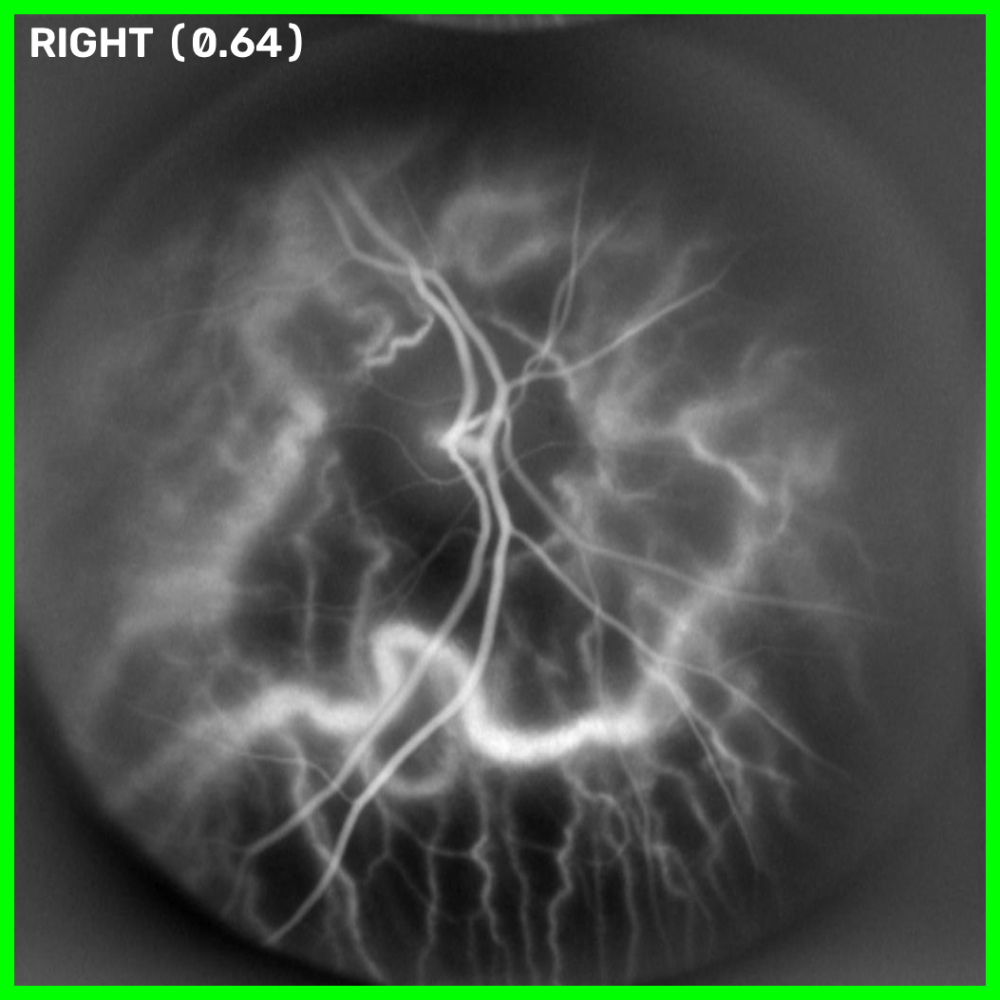

In [11]:
trained_model = YOLO("eye_side.pt")
show_class_result(trained_model, "classification/test/right/1050.png")

In [ ]:
def process_directory(model, directory_path, conf=0.25):
    """
    Finds all .png files in a directory and runs show_class_result on them.
    """
    # Convert string path to Path object
    path = Path(directory_path)

    # Check if directory exists
    if not path.is_dir():
        print(f"Error: {directory_path} is not a valid directory.")
        return

    # Find all .png files (case-insensitive)
    png_files = sorted(list(path.glob("*.png")))

    if not png_files:
        print(f"No PNG files found in {directory_path}")
        return

    print(f"Found {len(png_files)} images. Processing...")

    for img_path in png_files:
        print(f"\n--- Result for: {img_path.name} ---")
        show_class_result(model, img_path, conf)

def show_class_result(model, img_path, conf=0.25):
    # Load and preprocess image
    img = cv2.imread(str(img_path))
    if img is None:
        print(f"[Warning] Could not read {img_path}")
        return

    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Get model prediction
    results = model.predict(source=str(img_path), conf=conf, verbose=False, show=False, save=False)

    # Extract label and confidence
    if hasattr(results[0], "probs") and results[0].probs is not None:
        probs = results[0].probs.data.cpu().numpy()
        label_idx = np.argmax(probs)
        label = results[0].names[label_idx]
        confidence = probs[label_idx]
    else:
        label = "Unknown"
        confidence = 0.0

    # Choose color based on label
    if label.lower() == "left":
        color = (255, 0, 0)  # Red
    elif label.lower() == "right":
        color = (0, 255, 0)  # Green
    else:
        color = (255, 255, 0)  # Yellow

    # Draw border
    border_thickness = 15
    img_with_border = cv2.copyMakeBorder(
        img_rgb, border_thickness, border_thickness, border_thickness, border_thickness,
        cv2.BORDER_CONSTANT, value=color
    )

    # Add text label
    label_text = f"{label.upper()} ({confidence:.2f})"
    cv2.putText(
        img_with_border, label_text, (30, 60),
        cv2.FONT_HERSHEY_SIMPLEX, 1.5, (255, 255, 255), 4, cv2.LINE_AA
    )

    display(Image.fromarray(img_with_border))

model = YOLO("runs/train/eye_side_classification8/weights/eye_side.pt")
process_directory(model, "failures/")